# Verify the difference in accuracy by parameters

* Model
* Seed
* Ensemble
* Recycle

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)
from pathlib import Path
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams["font.size"] = 15
plt.rcParams['figure.figsize'] = (6, 4)
from scipy import stats

In [2]:
data_dir = Path('../../../../../data/')
dataset_dir = data_dir / 'out' / 'dataset'
subset_name = 'target_subset_' + Path('.').resolve().parent.name
score_dir = dataset_dir / 'score' / 'subsets' / subset_name
assert score_dir.exists()
fig_dir = score_dir / 'fig' / 'accuracy'
fig_dir.mkdir(parents=True, exist_ok=True)
target_list = data_dir / 'interim' / f'{subset_name}.csv'
assert target_list.exists()

In [3]:
label_path = score_dir / 'label.csv'
label_df = pd.read_csv(label_path, index_col=0)
target_df = pd.read_csv(target_list, index_col=0)
df = pd.merge(label_df, target_df, left_on='Target', right_on='id', how='left')
df

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,Length,id,resolution,releasedate,header,sequence,length,num_entry_in_cluster,num_entry_in_cluster_AF2_notInclude,is_similar_AF2
0,model_1_ptm_seed_0_rec_10_ens_1,0.829,0.791,0.725,0.858,0.858,0.897,0.855,0.422,model_1_ptm,...,564,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True
1,model_1_ptm_seed_0_rec_1_ens_1,0.830,0.795,0.733,0.864,0.864,0.905,0.875,36.027,model_1_ptm,...,564,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True
2,model_1_ptm_seed_0_rec_2_ens_1,0.830,0.793,0.733,0.862,0.862,0.900,0.863,7.015,model_1_ptm,...,564,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True
3,model_1_ptm_seed_0_rec_3_ens_1,0.830,0.793,0.735,0.862,0.862,0.895,0.851,0.720,model_1_ptm,...,564,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True
4,model_1_ptm_seed_0_rec_4_ens_1,0.830,0.791,0.732,0.860,0.860,0.898,0.859,1.855,model_1_ptm,...,564,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,model_5_seed_1_rec_7_ens_8,0.928,0.933,0.877,0.895,0.872,0.860,NaN,0.135,model_5,...,137,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False
106796,model_5_seed_1_rec_8_ens_1,0.929,0.935,0.879,0.895,0.872,0.859,NaN,0.335,model_5,...,137,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False
106797,model_5_seed_1_rec_8_ens_8,0.928,0.933,0.875,0.896,0.873,0.860,NaN,0.130,model_5,...,137,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False
106798,model_5_seed_1_rec_9_ens_1,0.928,0.933,0.879,0.896,0.873,0.861,NaN,0.435,model_5,...,137,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False


## Difference between models

In [4]:
df.columns

Index(['Model', 'TMscore', 'GDT_TS', 'GDT_HA', 'Global_LDDT', 'Mean_LDDT',
       'pLDDT', 'pTMscore', 'Tolerance', 'ModelName', 'Seed', 'Recycle',
       'Ensemble', 'Target', 'Num_diff', 'Num_missing', 'Length', 'id',
       'resolution', 'releasedate', 'header', 'sequence', 'length',
       'num_entry_in_cluster', 'num_entry_in_cluster_AF2_notInclude',
       'is_similar_AF2'],
      dtype='object')

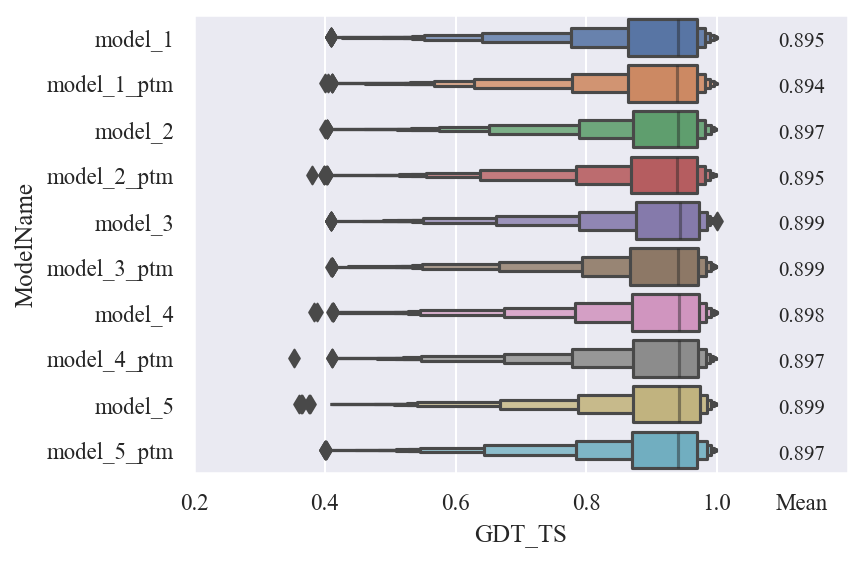

In [5]:
label = 'GDT_TS'
model_names = []
for i in range(10):
    model_name = f'model_{i // 2 + 1}'
    if i % 2 == 1:
        model_name += '_ptm'
    model_names.append(model_name)
sns.boxenplot(data=df.sort_values('ModelName'), x=label, y='ModelName', order=model_names)
xticks_max = 1.13
plt.xlim(None, 1.2)
xticks = np.append(np.arange(0.2, 1.2, 0.2), [xticks_max])
xticks_str = list(map(lambda x: str(x)[:3], xticks))
xticks_str[-1] = 'Mean'
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
mean_series = df.groupby('ModelName').mean()['GDT_TS']
for i, model_name in enumerate(model_names):
    value = mean_series[model_name]
    plt.text(xticks_max, i + 0.2, f'{value:.3f}', size=10, horizontalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxen_{label}_modelname.png')

## Difference between seeds

In [6]:
seed_0_df = df.query('Seed == 0')
seed_1_df = df.query('Seed == 1')
seed_df = pd.merge(seed_0_df, seed_1_df, on=['ModelName', 'Ensemble', 'Recycle', 'Target'], suffixes=('_seed_0', '_seed_1'))

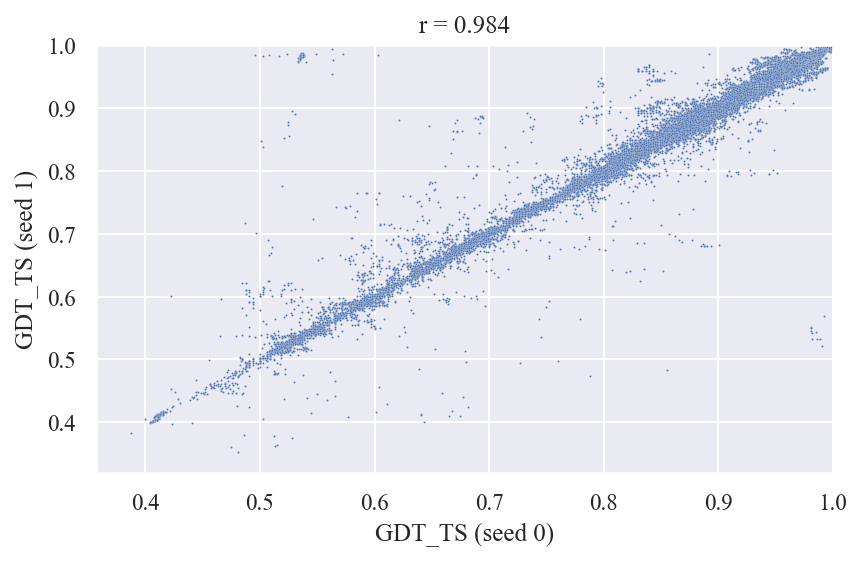

In [7]:
plt.figure(figsize=(6, 4))
label = 'GDT_TS'
sns.scatterplot(data=seed_df, x=f'{label}_seed_0', y=f'{label}_seed_1', s=1)
plt.xlabel(f'{label} (seed 0)')
plt.ylabel(f'{label} (seed 1)')
cc = seed_df.corr()[f'{label}_seed_0'][f'{label}_seed_1']
plt.title(f'r = {cc:.3f}')
plt.xlim(None, 1)
plt.ylim(None, 1)
plt.tight_layout()
plt.savefig(fig_dir / f'scatter_{label}_seed.png')

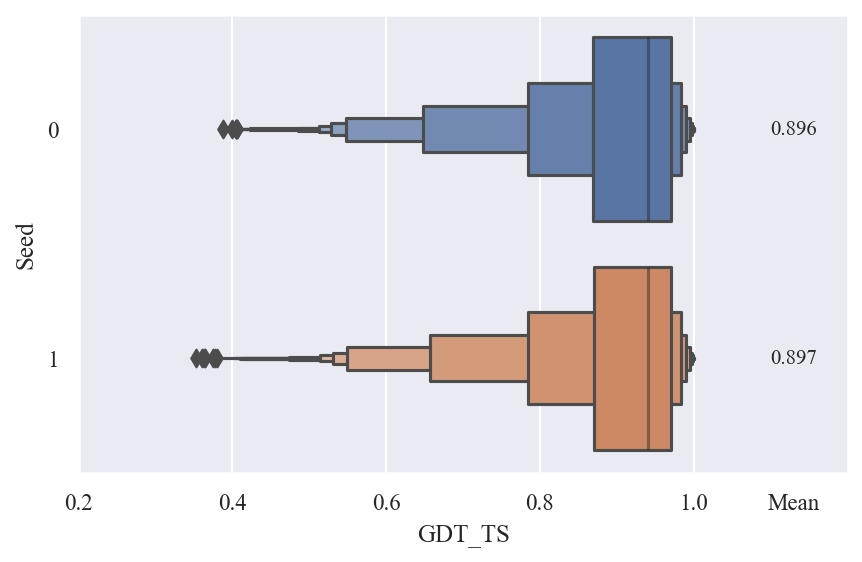

In [8]:
label = 'GDT_TS'
df['Seed'] = df['Seed'].astype(str)
sns.boxenplot(data=df, x=label, y='Seed')
df['Seed'] = df['Seed'].astype(int)
xticks_max = 1.13
plt.xlim(None, 1.2)
xticks = np.append(np.arange(0.2, 1.2, 0.2), [xticks_max])
xticks_str = list(map(lambda x: str(x)[:3], xticks))
xticks_str[-1] = 'Mean'
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
mean_series = df.groupby('Seed').mean()['GDT_TS']
for i, seed in enumerate([0, 1]):
    value = mean_series[seed]
    plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxen_{label}_seed.png')

In [9]:
# Wilcoxon signed-rank test between two seeeds
data = seed_df
x = f'{label}_seed_0'
y = f'{label}_seed_1'
print(data[x].mean(), data[y].mean())
print(stats.wilcoxon(data[x], data[y]))

0.8964286104868914 0.897330541198502
WilcoxonResult(statistic=364238958.0, pvalue=9.083320759759437e-09)



## Difference between with and without ensemble

In [10]:
df['Ensemble'] = [True if e == 8 else False for e in df['Ensemble']]
en_df = df.query('Ensemble == True')
no_en_df = df.query('Ensemble == False')
en_merge_df = pd.merge(en_df, no_en_df, on=['ModelName', 'Seed', 'Recycle', 'Target'], suffixes=('_en', '_no_en'))

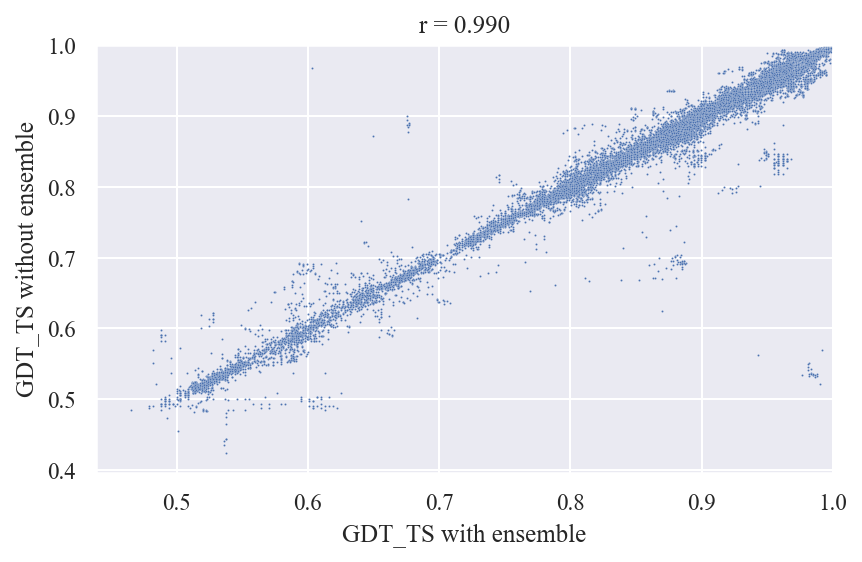

In [11]:
# Scatterplot of GDT_TS of models with and without ensemble
plt.figure(figsize=(6, 4))
label = 'GDT_TS'
sns.scatterplot(data=en_merge_df, x=f'{label}_en', y=f'{label}_no_en', s=1)
plt.xlabel(f'{label} with ensemble')
plt.ylabel(f'{label} without ensemble')
cc = en_merge_df.corr()[f'{label}_en'][f'{label}_no_en']
plt.title(f'r = {cc:.3f}')
plt.xlim(None, 1)
plt.ylim(None, 1)
plt.tight_layout()
plt.savefig(fig_dir / f'scatter_{label}_en_or_no_en.png')

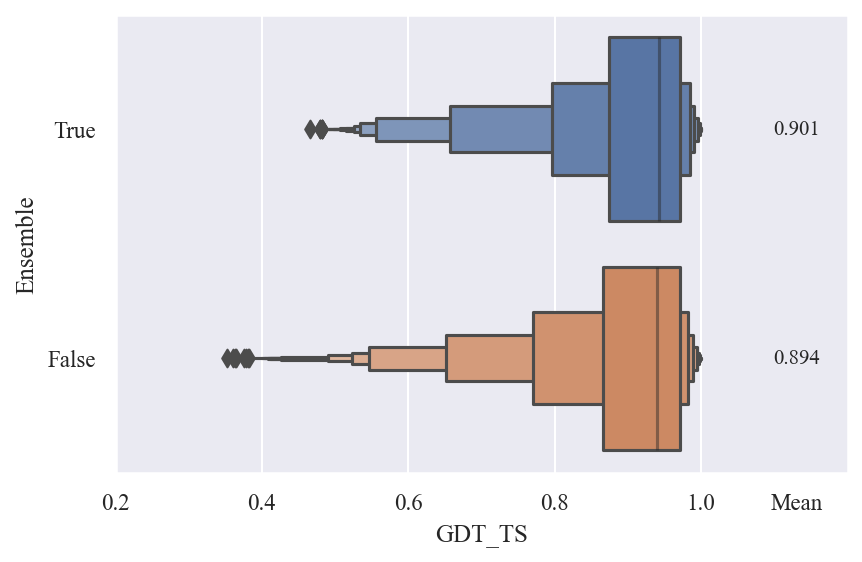

In [12]:
label = 'GDT_TS'
y = 'Ensemble'
df[y] = df[y].astype(str)
sns.boxenplot(data=df, x=label, y=y, order=['True', 'False'])
xticks_max = 1.13
plt.xlim(None, 1.2)
xticks = np.append(np.arange(0.2, 1.2, 0.2), [xticks_max])
xticks_str = list(map(lambda x: str(x)[:3], xticks))
xticks_str[-1] = 'Mean'
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
mean_series = df.groupby(y).mean()['GDT_TS']
for i, ens in enumerate(['True', 'False']):
    value = mean_series[ens]
    plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxen_{label}_ensemble.png')

In [13]:
# Wilcoxon signed-rank test between two seeeds
data = en_merge_df
x = f'{label}_en'
y = f'{label}_no_en'
print(data[x].mean(), data[y].mean())
print(stats.wilcoxon(data[x], data[y]))

0.9008840128205129 0.899735814102564
WilcoxonResult(statistic=263309542.5, pvalue=2.631868982096588e-71)


## Difference between recycles

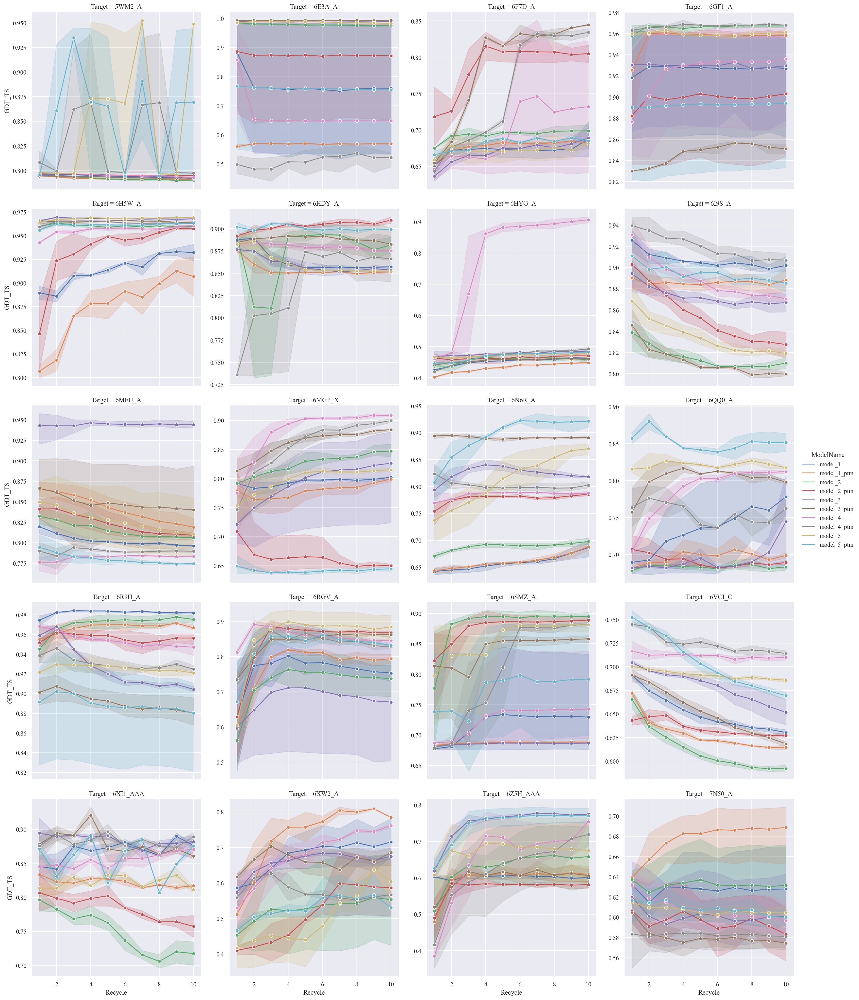

In [14]:
label = 'GDT_TS'
threshold = 0.15
# For targets whose value difference between max and min is larger than threshold
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > threshold)
sns.relplot(data=data.sort_values(['Target', 'ModelName']), x='Recycle', y='GDT_TS',
            hue='ModelName', kind='line', markers=True, dashes=True, marker='o',
            col='Target', col_wrap=4, facet_kws={'sharey': False, 'sharex': True})

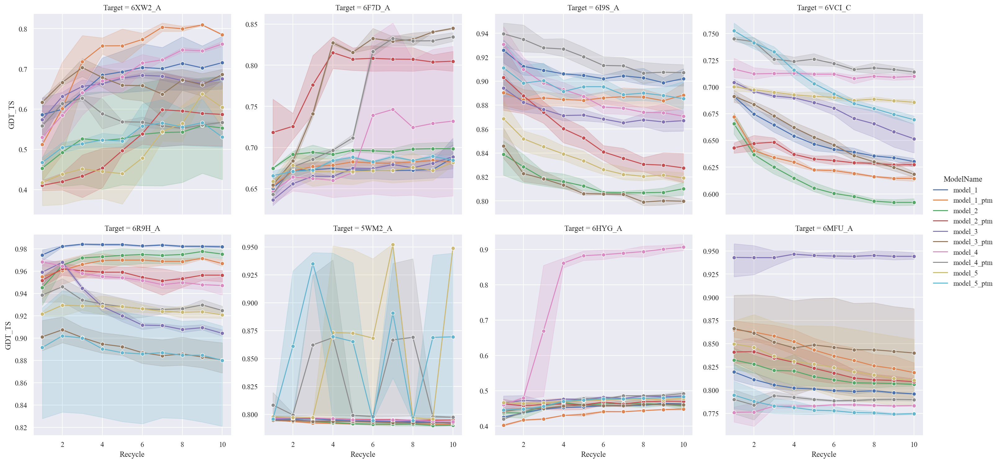

In [15]:
# Sample targets
label = 'GDT_TS'
sample_targets = ['6XW2_A', '6F7D_A', '6I9S_A', '6VCI_C', '6R9H_A', '5WM2_A', '6HYG_A', '6MFU_A']
data = df.query('Target in @sample_targets')
sns.relplot(data=data.sort_values(['Target', 'ModelName']), x='Recycle', y='GDT_TS',
            hue='ModelName', kind='line', markers=True, dashes=True, marker='o', col_order=sample_targets,
            col='Target', col_wrap=4, facet_kws={'sharey': False, 'sharex': True})
plt.savefig(fig_dir / f'lineplot_{label}_sample_8targets.png')

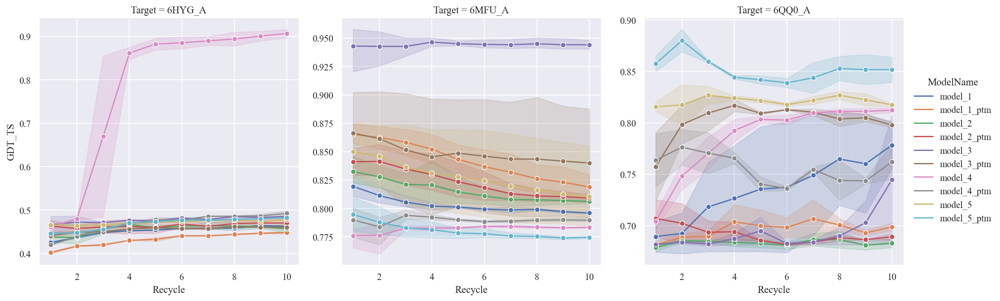

In [16]:
# Cases where there is a large difference in accuracy between models
label = 'GDT_TS'
sample_targets = ['6HYG_A', '6MFU_A', '6QQ0_A']
data = df.query('Target in @sample_targets')
sns.relplot(data=data.sort_values(['Target', 'ModelName']), x='Recycle', y='GDT_TS',
            hue='ModelName', kind='line', markers=True, dashes=True, marker='o', col_order=sample_targets,
            col='Target', col_wrap=3, facet_kws={'sharey': False, 'sharex': True})

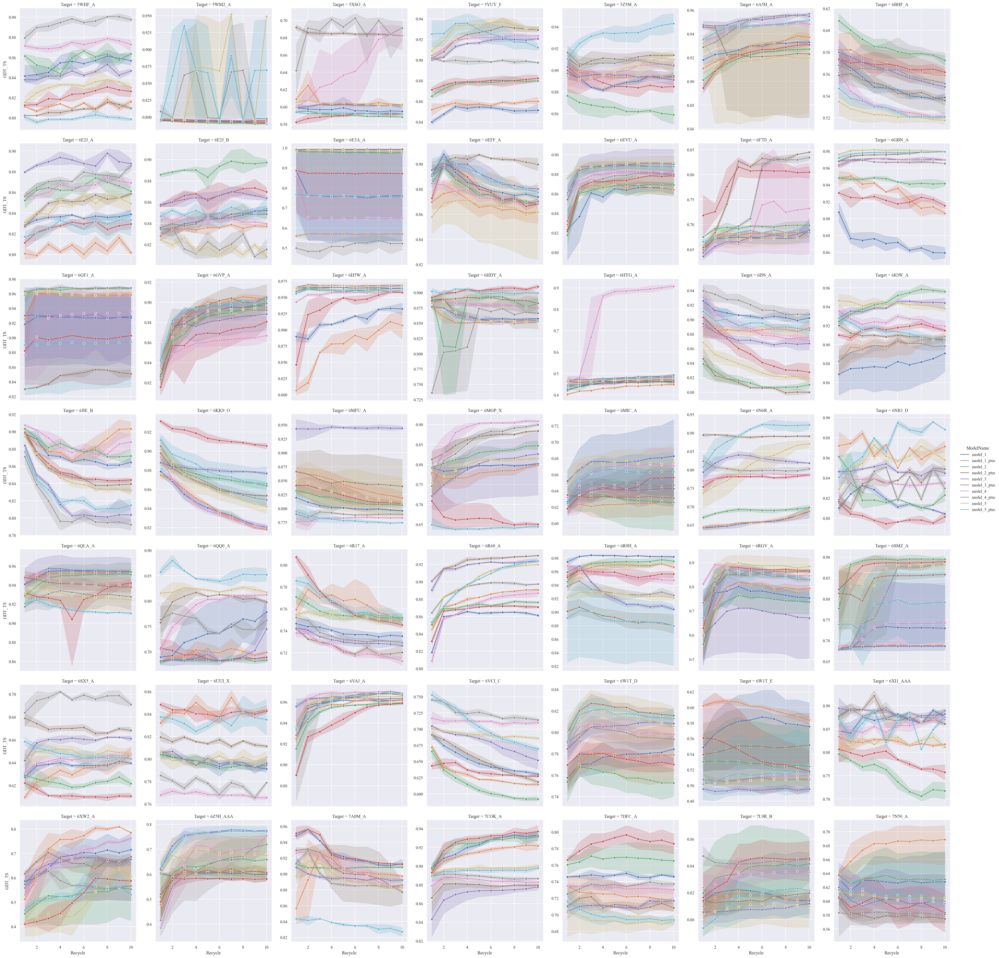

In [17]:
label = 'GDT_TS'
threshold = 0.1
# For targets whose value difference between max and min is larger than threshold
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > threshold)
sns.relplot(data=data.sort_values(['Target', 'ModelName']), x='Recycle', y='GDT_TS',
            hue='ModelName', kind='line', markers=True, dashes=True, marker='o',
            col='Target', col_wrap=7, facet_kws={'sharey': False, 'sharex': True})

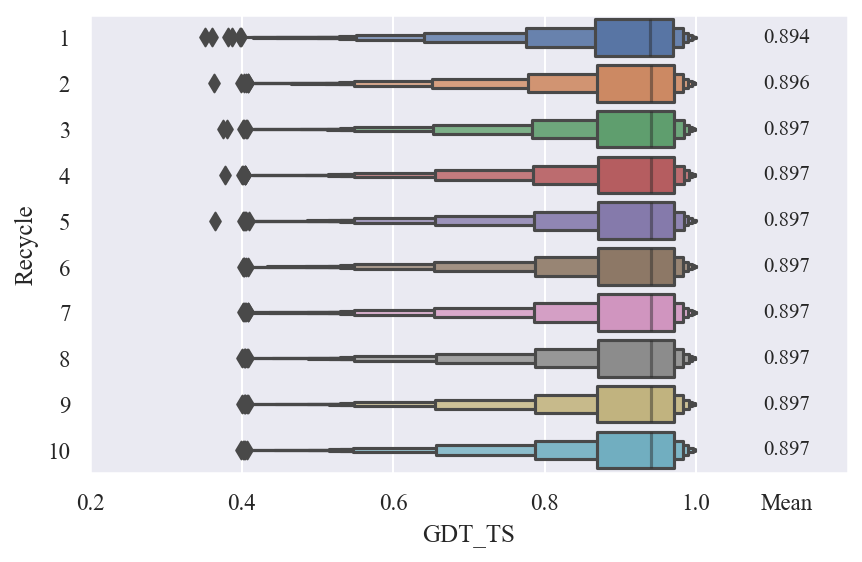

In [18]:
label = 'GDT_TS'
y = 'Recycle'
df[y] = df[y].astype(str)
sns.boxenplot(data=df, x=label, y=y, order=map(str, range(1, 11)))
df[y] = df[y].astype(int)
xticks_max = 1.12
plt.xlim(None, 1.2)
xticks = np.append(np.arange(0.2, 1.2, 0.2), [xticks_max])
xticks_str = list(map(lambda x: str(x)[:3], xticks))
xticks_str[-1] = 'Mean'
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
mean_series = df.groupby(y).mean()['GDT_TS']
for i, rec in enumerate(df[y].sort_values().unique()):
    value = mean_series[rec]
    plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxen_{label}_recycle.png')

In [19]:
df.groupby('Recycle').mean()[label]

Recycle
1    0.894
2    0.896
3    0.897
4    0.897
5    0.897
6    0.897
7    0.897
8    0.897
9    0.897
10   0.897
Name: GDT_TS, dtype: float64

## Difference between model_n and model_n_ptm

In [20]:
df['model_num'] = [m.split('_')[1] for m in df['ModelName']]
df['ptm'] = [True if m.endswith('_ptm') else False for m in df['ModelName']]
normal_df = df.query('ptm == False')
ptm_df = df.query('ptm == True')
model_df = pd.merge(normal_df, ptm_df, on=['model_num', 'Seed', 'Ensemble', 'Recycle', 'Target'], suffixes=('_normal', '_ptm'))
model_df

,Model_normal,TMscore_normal,GDT_TS_normal,GDT_HA_normal,Global_LDDT_normal,Mean_LDDT_normal,pLDDT_normal,pTMscore_normal,Tolerance_normal,ModelName_normal,...,id_ptm,resolution_ptm,releasedate_ptm,header_ptm,sequence_ptm,length_ptm,num_entry_in_cluster_ptm,num_entry_in_cluster_AF2_notInclude_ptm,is_similar_AF2_ptm,ptm_ptm
0,model_1_seed_0_rec_10_ens_1,0.830,0.791,0.730,0.862,0.862,0.907,NaN,0.632,model_1,...,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True,True
1,model_1_seed_0_rec_1_ens_1,0.830,0.795,0.739,0.864,0.864,0.916,NaN,36.190,model_1,...,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True,True
2,model_1_seed_0_rec_2_ens_1,0.830,0.796,0.740,0.864,0.864,0.912,NaN,7.160,model_1,...,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True,True
3,model_1_seed_0_rec_3_ens_1,0.830,0.796,0.741,0.865,0.865,0.910,NaN,0.608,model_1,...,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True,True
4,model_1_seed_0_rec_4_ens_1,0.830,0.795,0.739,0.864,0.864,0.910,NaN,0.557,model_1,...,5WM2_A,1.548,2018-05-23T00:00:00Z,>5wm2_A mol:protein length:564 Salicylate-AMP...,MGSSHHHHHHSSGLVPRGSHMLDGWVPWPESFARRYRAAGYWEGRP...,564,24,10,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53395,model_5_seed_1_rec_7_ens_8,0.928,0.933,0.877,0.895,0.872,0.860,NaN,0.135,model_5,...,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False,True
53396,model_5_seed_1_rec_8_ens_1,0.929,0.935,0.879,0.895,0.872,0.859,NaN,0.335,model_5,...,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False,True
53397,model_5_seed_1_rec_8_ens_8,0.928,0.933,0.875,0.896,0.873,0.860,NaN,0.130,model_5,...,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False,True
53398,model_5_seed_1_rec_9_ens_1,0.928,0.933,0.879,0.896,0.873,0.861,NaN,0.435,model_5,...,6SAN_A,1.360,2020-03-18T00:00:00Z,>6san_A mol:protein length:137 Deleted in mal...,MKLCILLAVVAFVGLSLGGSESSLALRLVNGGDRCQGRVEVLYQGS...,137,4,4,False,True


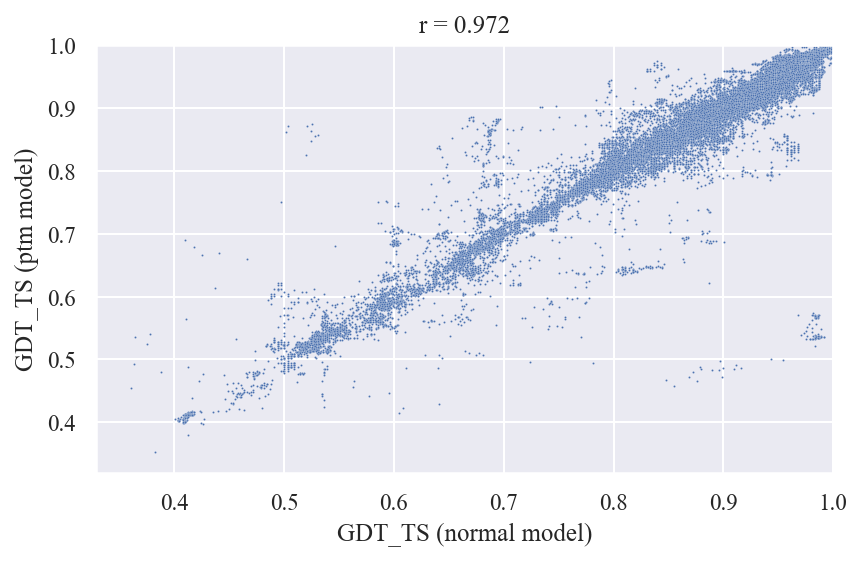

In [21]:
# Scatterplot of GDT_TS of models with and without ensemble
plt.figure(figsize=(6, 4))
label = 'GDT_TS'
sns.scatterplot(data=model_df, x=f'{label}_normal', y=f'{label}_ptm', s=1)
plt.xlabel(f'{label} (normal model)')
plt.ylabel(f'{label} (ptm model)')
cc = model_df.corr()[f'{label}_normal'][f'{label}_ptm']
plt.title(f'r = {cc:.3f}')
plt.xlim(None, 1)
plt.ylim(None, 1)
plt.tight_layout()
plt.savefig(fig_dir / f'scatter_{label}_model_normal_ptm.png')

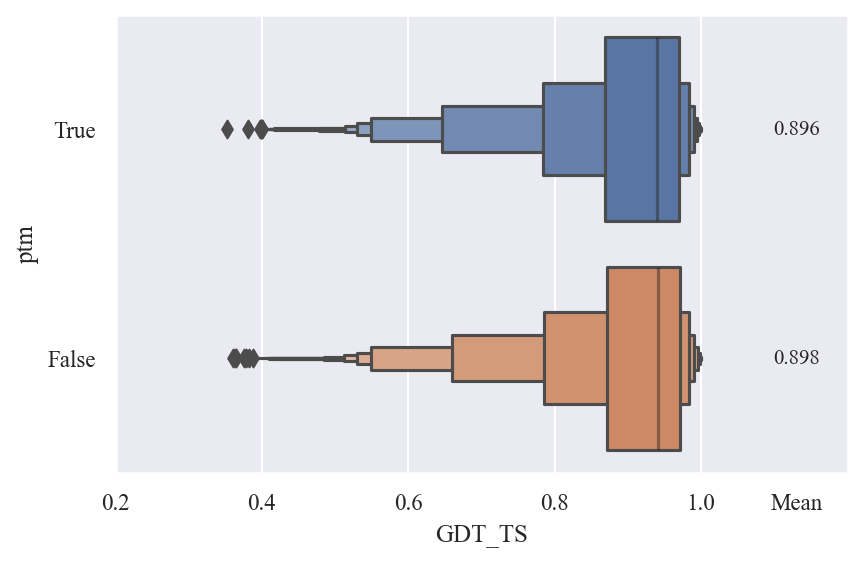

In [22]:
df['ptm'] = df['ptm'].astype(str)
sns.boxenplot(data=df, x='GDT_TS', y='ptm')
xticks_max = 1.13
plt.xlim(None, 1.2)
xticks = np.append(np.arange(0.2, 1.2, 0.2), [xticks_max])
xticks_str = list(map(lambda x: str(x)[:3], xticks))
xticks_str[-1] = 'Mean'
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
mean_series = df.groupby('ptm').mean()['GDT_TS']
for i, p in enumerate(['True', 'False']):
    value = mean_series[p]
    plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxen_{label}_normal_ptm_model.png')

In [23]:
# Wilcoxon signed-rank test between normal model and ptm model
data = model_df
x = f'{label}_normal'
y = f'{label}_ptm'
print(data[x].mean(), data[y].mean())
print(data[x].size, data[y].size)
print(stats.wilcoxon(data[x], data[y]))

0.8975827734082398 0.8961763782771536
53400 53400
WilcoxonResult(statistic=518955202.0, pvalue=3.0159141817481336e-75)


## Difference between the maximum accuracy of normal model and ptm model

<AxesSubplot:xlabel='GDT_TS', ylabel='ptm'>

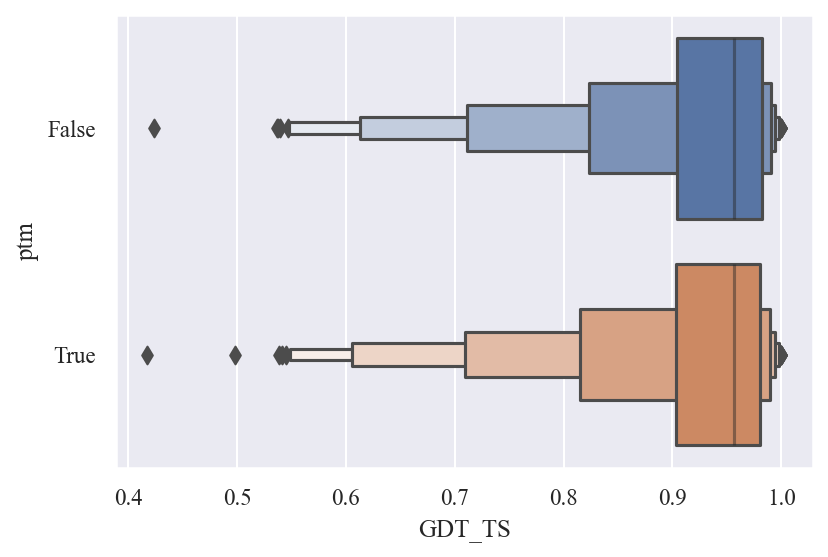

In [24]:
label = 'GDT_TS'
data = df.groupby(['Target', 'ptm']).max().reset_index()
sns.boxenplot(data=data, x=label, y='ptm')

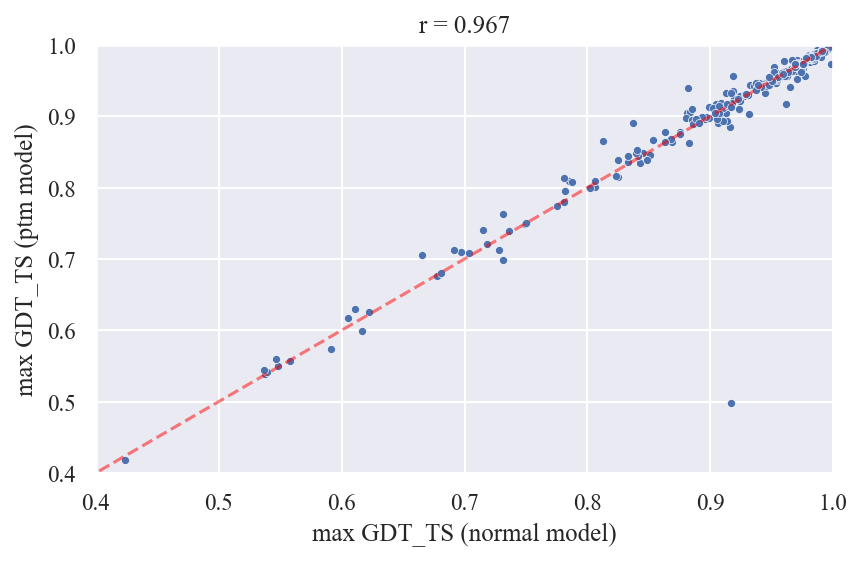

In [25]:
data = model_df.groupby('Target').max()
x_latent = np.linspace(0, 1, 100)
y_latent = x_latent
plt.plot(x_latent, y_latent, color='red', linestyle='--', alpha=0.5)
sns.scatterplot(data=data, x=f'{label}_normal', y=f'{label}_ptm', s=15)
plt.xlabel(f'max {label} (normal model)')
plt.ylabel(f'max {label} (ptm model)')
cc = data.corr()[f'{label}_normal'][f'{label}_ptm']
plt.title(f'r = {cc:.3f}')
plt.xlim(0.4, 1)
plt.ylim(0.4, 1)
plt.tight_layout()
plt.savefig(fig_dir / f'scatter_max_{label}_model_normal_ptm_each_target.png')